# Monopoly-alt

## Description:

*Monopoly-alt is a real-estate board game for two players. The player's goal is to buy as many properties and place as many real-estate as possible.*

### In-game items:
- dice - white cube with black dots on each side 
- counters - two cones with different colors which represent players
- cards - represent the properties a player owns
- board
- houses - green structures representing real estate

### Events:
- rolling the dice
- buying property
- moving a counter
- placing real estate
- selling property for mortgage

## Dataset

Dataset is organized into two folders depending on the resolution

```
/quality_480/
/quality_1080/
```

Inside each folder there are video files of format

```
<expected_grade>_<difficulty>.mp4
```


In [5]:
# Import libraries
from PIL.ExifTags import TAGS
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utilities import *
%matplotlib inline


### Grade 3

#### Detection

- dice
- counter

#### Tracking

- counter

In [4]:
cap_e = cv2.VideoCapture("quality_1080/3_easy_2.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/3_medium.mp4")
cap_m.set(1, 30*15)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
cap_h.set(1, 30*15)
_, frame_h = cap_h.read()
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


ValueError: zero-dimensional arrays cannot be concatenated

### Grade 4


#### Events

- buying property
- moving a counter

In [ ]:
cap_e = cv2.VideoCapture("quality_1080/4_cards_easy.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/4_cards_medium.mp4")
cap_m.set(1, 30*29)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/4_cards_hard.mp4")
cap_h.set(1, 30*23)
_, frame_h = cap_h.read()
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


ValueError: zero-dimensional arrays cannot be concatenated

### Grade 5

#### Events

- buying property
- moving counter
- placing real-estate
- selling mortgage
- rolling the dice

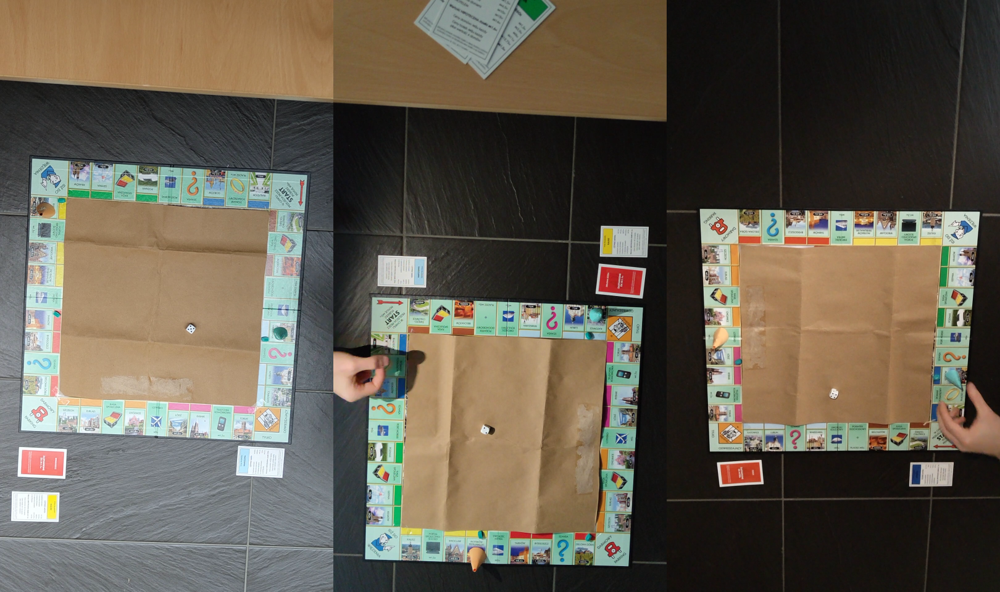

In [ ]:
cap_e = cv2.VideoCapture("quality_1080/5_easy.mp4")
cap_e.set(1, 30*49)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/5_medium.mp4")
cap_m.set(1, 30*48)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/5_hard.mp4")
cap_h.set(1, 30*30)
_, frame_h = cap_h.read()
frame_h = cv2.rotate(frame_h, cv2.ROTATE_90_CLOCKWISE)
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


## Grade 3

In [6]:
def show_frames(frames):
    imshow(cv2.resize(np.concatenate(frames, axis=1), (0, 0), fx=0.5, fy=0.5))


In [ ]:
# cap_e = cv2.VideoCapture("quality_1080/3_easy_2.mp4")
# cap_e.set(1, 30*1)
# _, frame_e = cap_e.read()
# cap_m = cv2.VideoCapture("quality_1080/3_medium.mp4")
# cap_m.set(1, 30*1)
# _, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
cap_h.set(1, 30*1)
_, frame_h = cap_h.read()
frames = frame_e, frame_m, frame_h


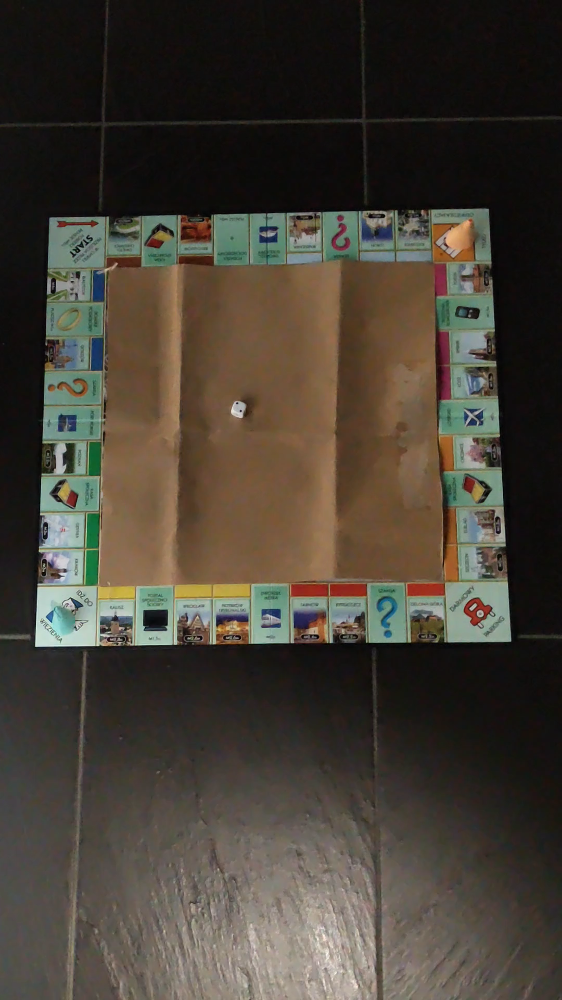

In [ ]:
imshow(frame_h)

#### Utilities

In [7]:
# cuts image to only show contour, warp if you want to match the contour with rotation
def cut_bbox(frame, contour, warp=True):
    if warp:
        rect = cv2.minAreaRect(contour)

        box = cv2.boxPoints(rect)
        box = np.int0(box)

        # get width and height of the detected rectangle
        width = int(rect[1][0])
        height = int(rect[1][1])

        src_pts = box.astype("float32")
        # coordinate of the points in box points after the rectangle has been
        # straightened
        dst_pts = np.array([[0, height-1],
                            [0, 0],
                            [width-1, 0],
                            [width-1, height-1]], dtype="float32")

        # the perspective transformation matrix
        M = cv2.getPerspectiveTransform(src_pts, dst_pts)

        # directly warp the rotated rectangle to get the straightened rectangle
        return cv2.warpPerspective(frame, M, (width, height))
    else:
        rect = cv2.boundingRect(contour)
        return frame[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]]


In [8]:
def draw_bbox(frame, bbox, color=(255, 255, 255)):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, color, 2, 1)


In [9]:
def mask_color(img,lower,upper):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return cv2.inRange(hsv, lower, upper)

In [10]:
def find_color_bounds(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return np.min(hsv, axis=(0, 1)), np.max(hsv, axis=(0, 1))
    

In [11]:
def draw_rectangle_from_contours(source_img,contours):
    drawing = source_img.copy()
    for i in range(len(contours)):
        
        rect = cv2.minAreaRect(contours[i])
        box = cv2.boxPoints(rect)
        box = np.int0(box)

        cv2.drawContours(drawing, [box], 0, (0, 0, 255), 2)
    return drawing

### Dice detection

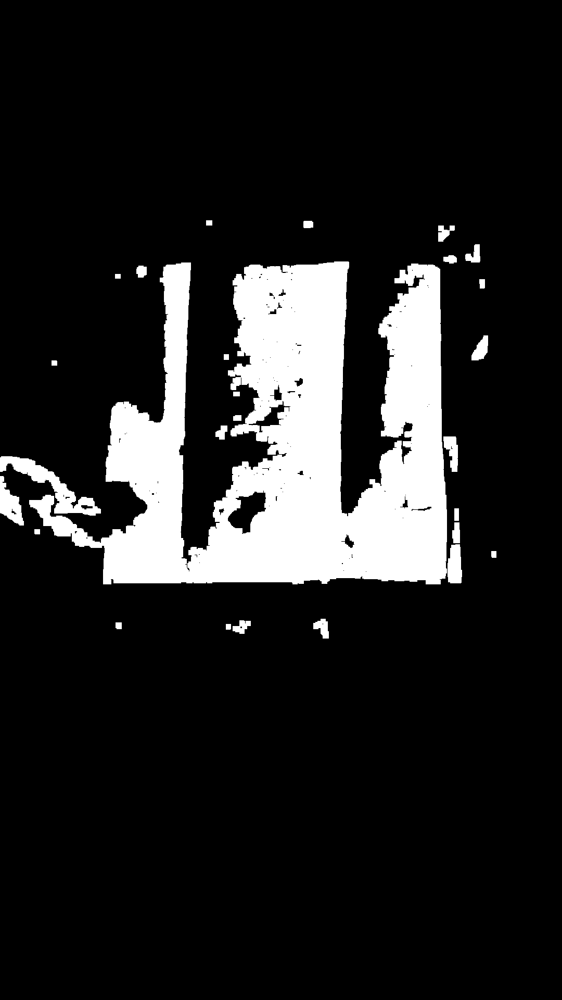

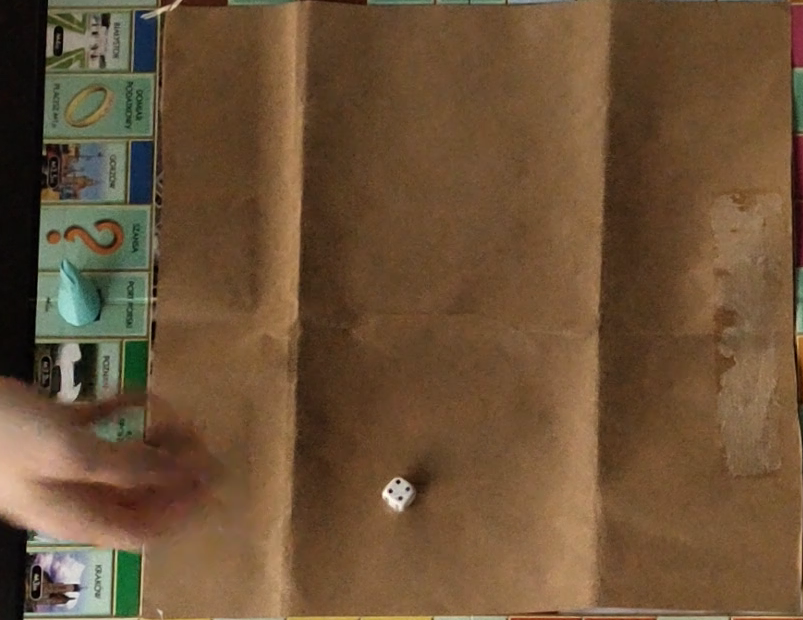

In [12]:
# Find approximate region of the center of the board
def find_center_space(frame):

    lower = np.array([9, 80, 100], np.uint8)
    upper = np.array([19, 210, 235], np.uint8)
    mask = mask_color(frame, lower, upper)
    

    new = cv2.morphologyEx(mask,cv2.MORPH_OPEN,np.ones((9,9)))
    contours, _ = cv2.findContours(
        new, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for c in contours:

        area = cv2.contourArea(c)
        if area > 22000:
            return new,c
    return new,None


mask, contour = find_center_space(frame_h)
space = cut_bbox(frame_h, contour, False)
imshow(mask)
imshow(space)


In [13]:
def check_box_inside_contour(box, contour):
    rect = cv2.boundingRect(contour)
    return box[0] > rect[0] and box[1] > rect[1] and box[0] + box[2] < rect[0] + rect[2]  and box[1] + box[3] < rect[1] + rect[3]

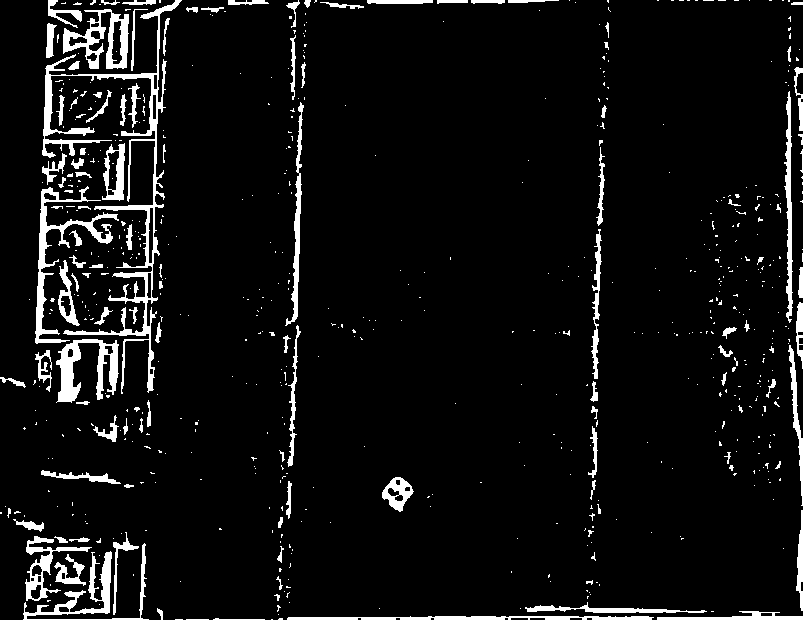

In [14]:
def find_white(frame,lightness_threshold = 190):
    lightness_channel = cv2.cvtColor(frame, cv2.COLOR_BGR2HLS)[:,:,1]
    #imshow(lightness_channel)
    threshed = cv2.adaptiveThreshold(lightness_channel,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,15,-11)
    threshed = cv2.morphologyEx(threshed,cv2.MORPH_CLOSE,np.ones((3,3)))
    #th, threshed = cv2.threshold(
     #   lightness_channel, lightness_threshold, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return threshed
imshow(find_white(space))

dice must be inside the center of the board

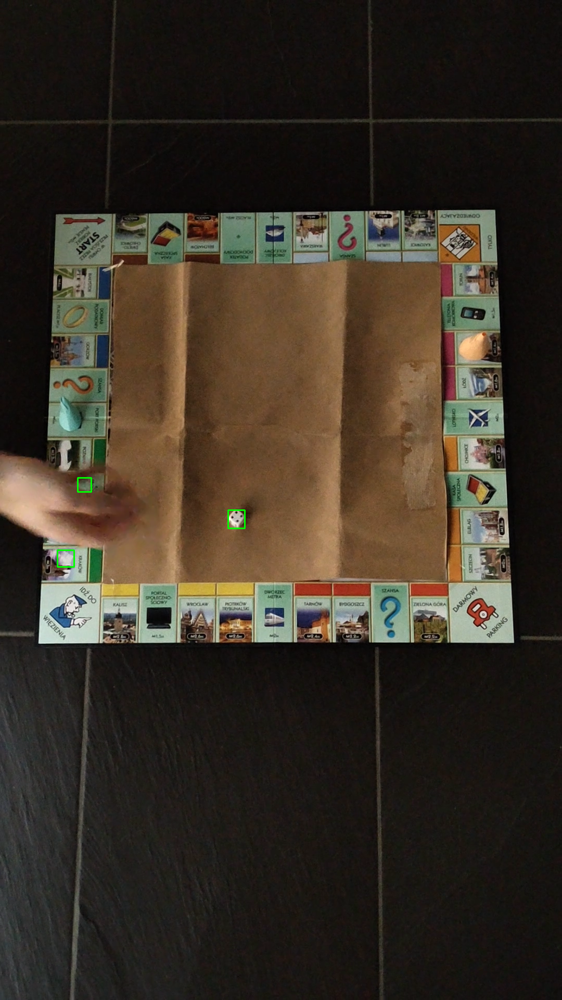

In [15]:
def find_possible_dice_positions(frame, rectangle):
    threshed = find_white(frame)
    
    contours, _ = cv2.findContours(
        threshed, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    new_c = []
    for c in contours:
        
        rect = cv2.boundingRect(c)
        area = rect[2] * rect[3]
        if 1200 > area > 600 and abs(rect[2]/rect[3] - 1) < 0.2:  # certain size and near square
            if check_box_inside_contour(rect,rectangle):
                new_c.append(rect)
    return new_c


boxes = find_possible_dice_positions(frame_h,contour)
draw = frame_h.copy()
for bbox in boxes:
    draw_bbox(draw, bbox, (0, 255, 0))
imshow(draw)


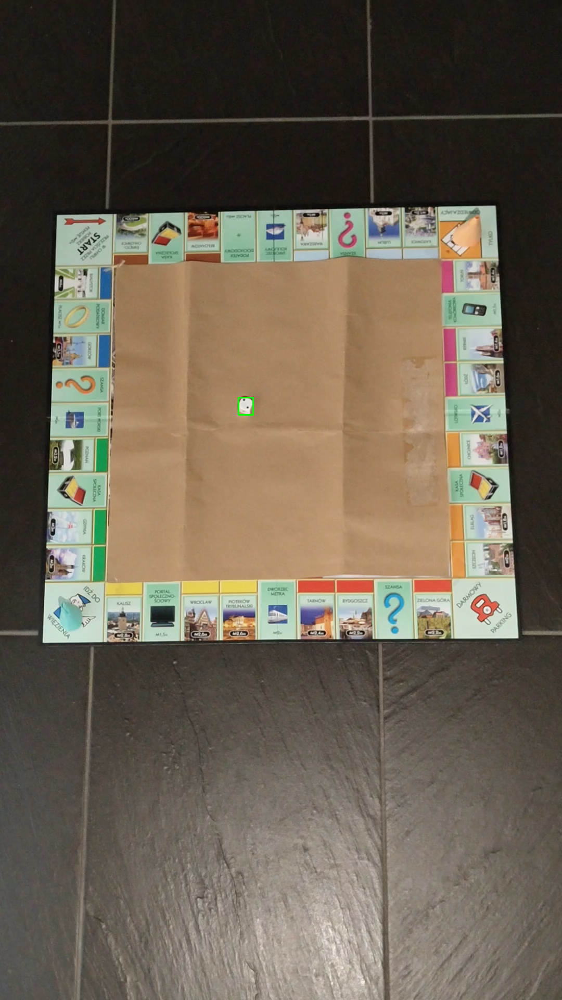

KeyboardInterrupt: 

In [16]:
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
i = 0

CALIBRATION_PERIOD = 1
while (True):
    #
    _, frame_h = cap_h.read()
    i+=1
    drawing = frame_h.copy()
    if i == CALIBRATION_PERIOD: #since camera moves only slightly, we can use the same center for the whole video
        _, contour = find_center_space(frame_h)
    if contour is not None:
        boxes = find_possible_dice_positions(frame_h,contour)
        
        for bbox in boxes:
            draw_bbox(drawing, bbox, (0, 255, 0))
    if i == CALIBRATION_PERIOD:
        imshow(drawing)
    
    cv2.imshow('frame', cv2.resize(drawing,(480,900)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break


### Counter detection

We perform calibration on 3_easy video, and keep roughly the same config for other videos with the same environment

In [ ]:
mvideo = cv2.VideoCapture('process/3_hard.mp4')
ret, CALIB_FRAME = mvideo.read()
CALIB_CROP = CALIB_FRAME[1460:1490, 158:188]

imshow(CALIB_CROP)
min_h, max_h = thresholds_for_crop(CALIB_CROP)  
lower_col = np.array(min_h, np.uint8)
upper_col = np.array(max_h, np.uint8) 

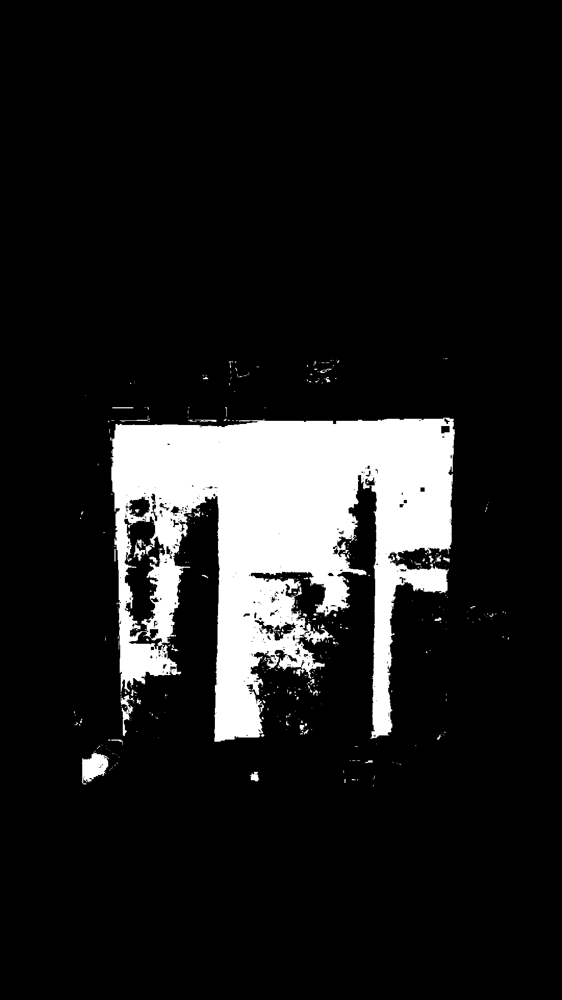

In [ ]:
mvideo = cv2.VideoCapture('process/3_hard.mp4')
ret, frame = mvideo.read()

mask = mask_color(frame, lower_col ,upper_col)
imshow(mask)

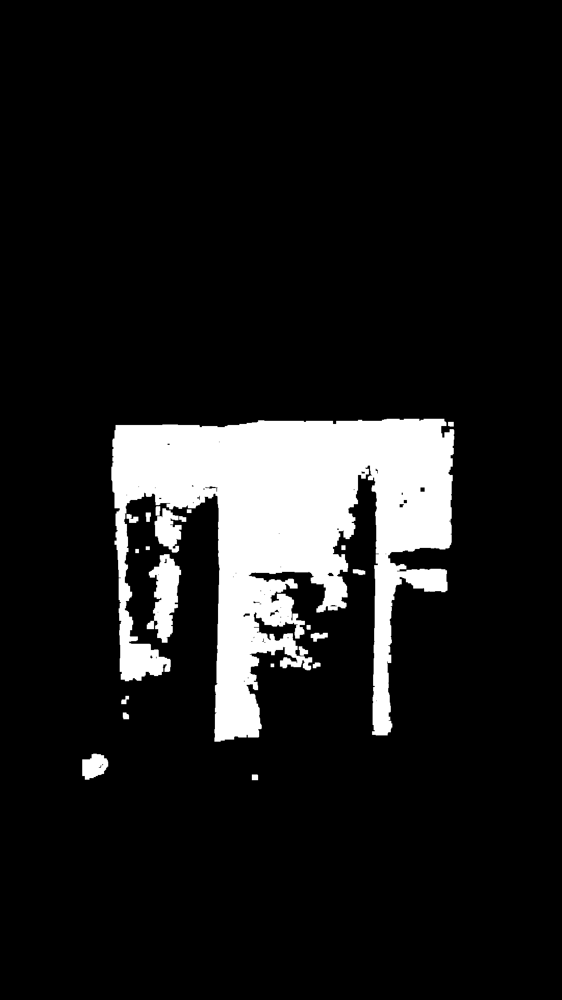

In [ ]:
contours, mask2_ = filter_for_counter(mask, 1600, 2400)
imshow(mask2_)

In [ ]:
counter_crop, box = find_counter(frame, contours, 0)
ret, frame = mvideo.read()
with_rectangles = draw_rectangle_from_contours(frame, contours)

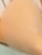

(146, 1439, 67, 60)


In [ ]:
counter_crop, box = find_counter(frame,contours)
imshow(counter_crop)
cv_box = corners_to_cvbbox(box)
print(cv_box)

### Counter tracking

In [ ]:
stop

NameError: name 'stop' is not defined

In [ ]:
# P A R A M E T E R S 1080p
# 5_easy - orangeL,U - 1600, 2800; 3_medium - orangeL,U - 2400, 3000 
mvideo = cv2.VideoCapture('process/3_hard.mp4')
mvideo.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, CALIB_FRAME = mvideo.read()

BOXES_DISTANCE = 50
STABLE_PERIOD_C = 15
MOVE_EPSILON = 50
STABLE_EPSILON_C = 50
distances_c = []
stable_counter_c = 0
moving = False
appx=4
# 3_eazy orangeU=3000
# orangeCalib = CALIB_FRAME[565:585, 150:175]
# 3_hard
orangeCalib = CALIB_FRAME[1460:1490, 158:188]
# 5_hard orangeL,U= 1600, 2400
orangeL = 1600
orangeU = 2400
last_box = None
flagO = 0

mvideo = cv2.VideoCapture('process/3_hard.mp4')
mvideo_width = int(mvideo.get(3))
mvideo_height = int(mvideo.get(4))
mvideo_fps = mvideo.get(cv2.CAP_PROP_FPS)

ret, FIRST_FRAME = mvideo.read()

playerO_bbox, cropO_ = get_player_box(FIRST_FRAME, orangeCalib, orangeL, orangeU, inv=0, approx=appx)
playerO_tracker = create_tracker('MIL')

if playerO_tracker.init(frame, playerO_bbox):
  print('Player tracking algorithm initiated at point:', playerO_bbox)

mvideo_track = cv2.VideoWriter('./counters_tempname.avi', cv2.VideoWriter_fourcc(*'DIVX'), mvideo_fps, (mvideo_width + 800, mvideo_height))

mvideo.set(cv2.CAP_PROP_POS_FRAMES, 0)

_ = 0
while mvideo.isOpened():
    ret, frame = mvideo.read()

    if ret:
      
      strip_width = 800
      frame = cv2.copyMakeBorder(frame, 0, 0, 0, strip_width, cv2.BORDER_CONSTANT, value=(0,0,0))
  
      ok, bboxO = playerO_tracker.update(frame)
      if ok: draw_bbox(frame, bboxO, (0, 255, 0))
      if _ == 0:
        last_box = bboxO

      if _ % 10:
        try:
          det_boxO = get_player_box(frame, orangeCalib, orangeL, orangeU, inv=0, approx=appx)
          
          if ((bboxO[0] - det_boxO[0])**2 + (bboxO[1] - det_boxO[1])**2) ** 0.5 < 50:
            if flagO == 1:
              ok, bboxO = playerO_tracker.update(frame, det_boxO)
              if ok: draw_bbox(frame, bboxO, (0, 255, 255))
              flagO = 0
            else: flagO = 1

          else:
            draw_bbox(frame, bboxO, (0, 255, 255))
            imshow(frame)
        except: pass

      # checking if counter moved
      # if _% 2:
      frame, moving, stable_counter_c = check_if_counter_moved(frame, last_box, bboxO, MOVE_EPSILON, STABLE_EPSILON_C, STABLE_PERIOD_C, stable_counter_c, moving)
      last_box = bboxO

      mvideo_track.write(frame)
      _ += 1
      
      # if _ == 200:
      #   break
      
    else:
        break

mvideo_track.release()

In [ ]:
stop

NameError: name 'stop' is not defined

#### VIDEO: final_videos/counter_tracking_3_hard.mp4

## Grade 4

In [17]:
def draw_card_frame(frame,cards):
    new_frame = draw_rectangle_from_contours(frame, cards)

    return new_frame

### Buying a property (placing a card)
### Mortgages

In [ ]:
cap_e = cv2.VideoCapture("quality_1080/4_cards_easy.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/4_cards_medium.mp4")
cap_m.set(1, 30*29)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/4_cards_hard.mp4")
cap_h.set(1, 30*23)
_, frame_h = cap_h.read()

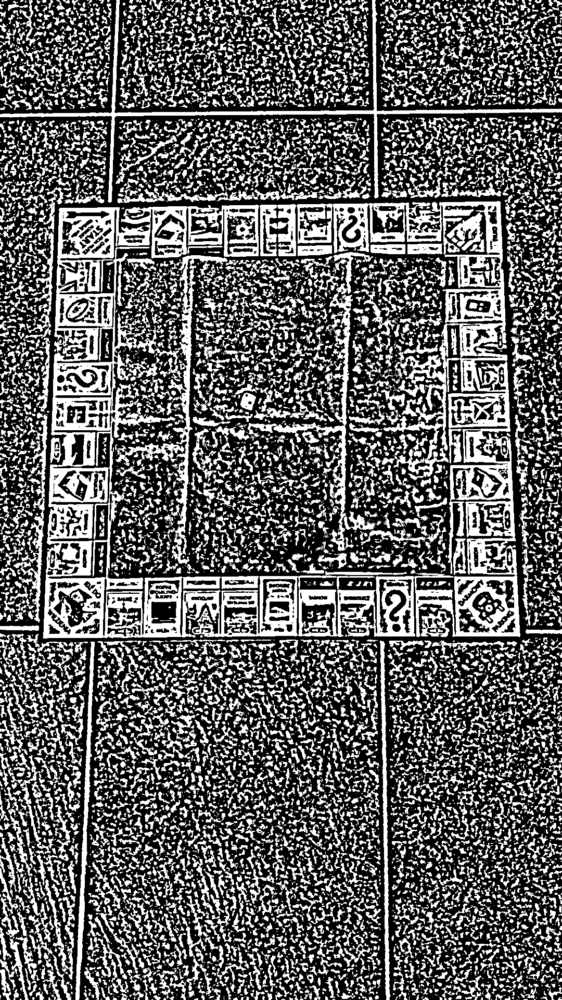

In [18]:
def cards_threshold(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    threshed = cv2.adaptiveThreshold(cv2.blur(gray, (3, 3)), 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                     cv2.THRESH_BINARY, 15, 0)
    return threshed
imshow(cards_threshold(frame_h))

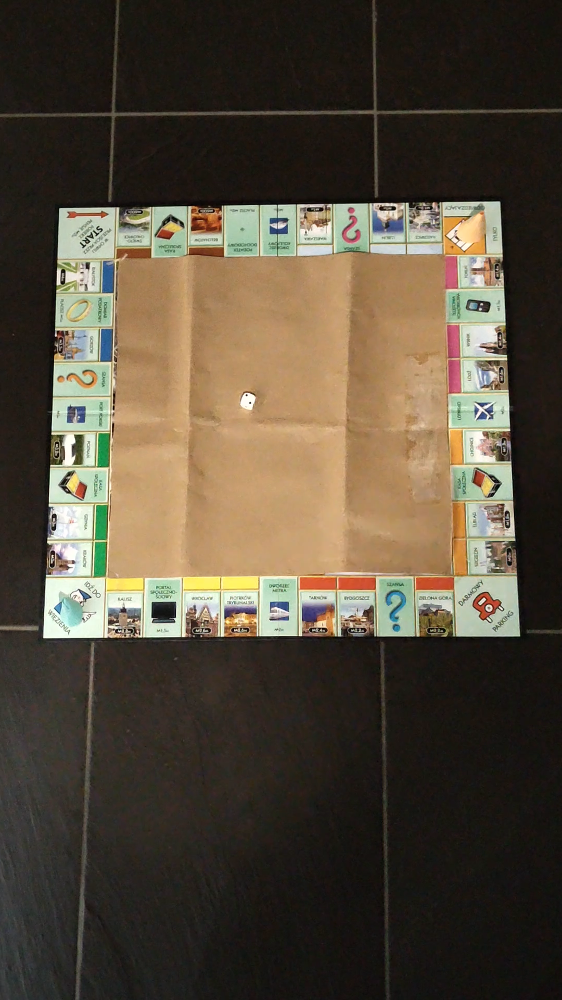

In [19]:
def find_cards(frame):
    threshed = cards_threshold(frame)
    contours, hierarchy = cv2.findContours(
        threshed, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,)

    MIN_AREA = 8000 # scales with resolution
    MAX_AREA = 20000 # scales with resolution
    cards = []
    CARD_ASPECT = 0.58
    ASPECT_SENSITIVITY = 0.1
    ARC_DIFFERENCE_SENSITIVITY = 100 # scales with resolution
    for c, h in zip(contours, hierarchy[0]):

        area = cv2.contourArea(c)
        approx = cv2.approxPolyDP(c, 0.05*cv2.arcLength(c, True), True)
        convexHull = cv2.convexHull(approx)

        if h[3] == -1 and len(approx) == 4 and MAX_AREA > area > MIN_AREA:
            #print(area)
            try:
                convexityDefects = cv2.convexityDefects(
                    approx, cv2.convexHull(approx, returnPoints=False))
                if convexityDefects:
                    continue
            except:
                continue

            rect = cv2.minAreaRect(c)

            # get width and height of the detected rectangle
            width = int(rect[1][0])
            height = int(rect[1][1])

            if abs(cv2.arcLength(c, True) - (width*2+height*2)) < ARC_DIFFERENCE_SENSITIVITY:

                # if its aspect ratio is more or less the card ratio xD
                if abs(width/height - CARD_ASPECT) < ASPECT_SENSITIVITY or abs(height/width - CARD_ASPECT) < ASPECT_SENSITIVITY:
                    cards.append(approx)
    return cards

cards = find_cards(frame_h)
imshow(draw_card_frame(frame_h, cards))

In [20]:
def get_cards_images(frame,cards):
    card_images = []
    for card in cards:
        card_image = cut_bbox(frame,card)
        card_images.append(card_image)
    return(card_images)

cards_images = get_cards_images(frame_h,cards)
for card in cards_images:
    imshow(card)

In [21]:
from sklearn.cluster import KMeans
from collections import Counter
def get_dominant_color(image, k=2, image_processing_size = None):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:,:,:]
    #reshape the image to be a list of pixels
    image = image.reshape((image.shape[0] * image.shape[1], 3))

    #cluster and assign labels to the pixels 
    clt = KMeans(n_clusters = k)
    labels = clt.fit_predict(image)

    #count labels to find most popular
    label_counts = Counter(labels)

    #subset out most popular centroid
    h = label_counts.most_common(2)
    
    first = clt.cluster_centers_[h[0][0]]
    second= clt.cluster_centers_[h[1][0]]
   # print(clt.cluster_centers_)

    return [first,second]

In [22]:
# https://stackoverflow.com/questions/2566412/find-nearest-value-in-numpy-array
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    if abs(array[idx] - value) < 20:

        return array[idx], idx
    idx = (np.abs(array - value)).argmax() # hsv is a circle
    if abs(array[idx] - value) > 170:

        return array[idx], idx
    return None, None

In [23]:
class CardController():
    cards = []
    mortgaged_count = 0
    def __init__(self):
        self.cards = []
        self.mortgaged_count = 0
    def update(self,new_cards):
        if len(new_cards) != len(self.cards):
            return self.find_diffs(new_cards)
    def find_diffs(self,new_cards):
        count = 0 #count of mortgaged cards this update
        for card in new_cards:
            color1, color2 = get_dominant_color(card)
            #print(color1,color2)
            if len(self.cards) > 0:
                nearest,idx = find_nearest(self.cards,color2[0])
                if nearest is None:
                    if color1[0] < 20 and color1[1] > 100: # high saturation red
                        count +=1
                    else:
                        self.cards.append(color2[0])
                     #   print(self.cards, color)
                        return f"New card placed!"
                else:
                        self.cards[idx] = color2[0] # update color, heuristic that the color won't change drastically between frames
            else:
                self.cards.append(color2[0])
                #print(self.cards, color)
                return f"New card placed!"
        if self.mortgaged_count < count:
            self.mortgaged_count = count
            return f"Card mortgaged!"
        #self.cards = means
        #print(means)


In [24]:
# mvideo = cv2.VideoCapture('quality_1080/5_hard.mp4')
# mvideo.set(1, 30*0)
# card_controller = CardController()
# i=0
# EVENT_LENGTH = 7
# last_event = -3
# event = None
# while (True):
#     # Grab the latest image from the video feed
#     ret, frame = mvideo.read()
#     ret, frame = mvideo.read()
#     ret, frame = mvideo.read()
#     i+=1
#     frame = frame  # [500:]
#     cards = find_cards(frame)

#     drawing = draw_card_frame(frame, cards)


#     cards_images = get_cards_images(frame,cards)
#     e = card_controller.update(cards_images)
#     if e is not None:
#         last_event = i
#         event = e
#         print(event)
#         # if len(card_controller.cards) == 3:
#         #     imshow(frame)
#         #     break
#     if last_event + EVENT_LENGTH > i:
#         cv2.putText(drawing, event, (10, 100),
#             cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)

#     cv2.imshow('frame', cv2.resize(drawing,(480,200)))

#     res = cv2.waitKey(1)

#     # Stop if the user presses "q"
#     if res & 0xFF == ord('q'):
#         break

better

In [25]:
mvideo = cv2.VideoCapture('quality_1080/5_hard.mp4')
mvideo.set(1, 30*0)
card_controller = CardController()
i=0
EVENT_LENGTH = 7
last_event = -3
event = None
while mvideo.isOpened():
    # Grab the latest image from the video feed
    ret, frame = mvideo.read()
    ret, frame = mvideo.read()
    ret, frame = mvideo.read()
    i+=1
    frame = frame  # [500:]
    cards = find_cards(frame)

    drawing = draw_card_frame(frame, cards)


    cards_images = get_cards_images(frame,cards)
    e = card_controller.update(cards_images)
    if e is not None:
        last_event = i
        event = e
        print(event)
        # if len(card_controller.cards) == 3:
        #     imshow(frame)
        #     break
    if last_event + EVENT_LENGTH > i:
        cv2.putText(drawing, event, (10, 100),
            cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)

    cv2.imshow('frame', cv2.resize(drawing,(480,200)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break

KeyboardInterrupt: 

### Moving a counter

In [ ]:
def check_if_counter_moved(frame, last_box, new_box, MOVE_EPSILON, STABLE_EPSILON_C, STABLE_PERIOD_C, stable_counter_c, moving):
    distance = distance_between_boxes(last_box, new_box)
    if distance > MOVE_EPSILON:
        moving = True
    if distance < STABLE_EPSILON_C and moving:
        stable_counter_c +=1
    else:
        stable_counter_c = 0
    if stable_counter_c >= STABLE_PERIOD_C:
        moving = False
    
    if moving:
        cv2.putText(frame, "MOVING", (1100, 300),
            cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 255), 2, cv2.LINE_AA)
    return frame, moving, stable_counter_c

## Grade 5

### Placing real estate

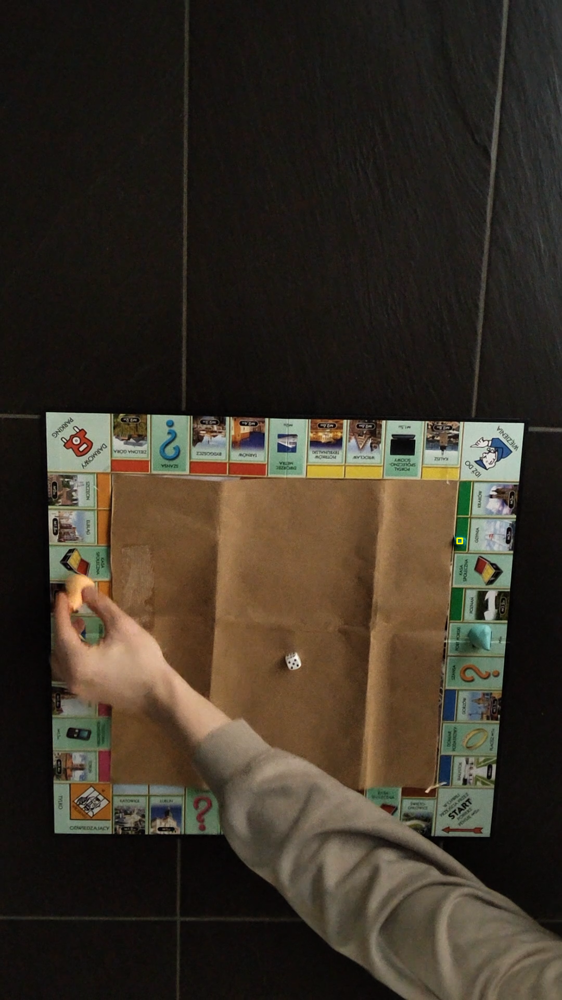

In [ ]:
mvideo = cv2.VideoCapture('process/5_hard_houses.mp4')

mvideo_width = int(mvideo.get(3))
mvideo_height = int(mvideo.get(4))

mvideo_fps = mvideo.get(cv2.CAP_PROP_FPS)

# C A L I B R A T I O N
mvideo.set(cv2.CAP_PROP_POS_FRAMES, 630)
ret, CALIB_FRAME = mvideo.read()

# CALIB_CROP =  CALIB_FRAME[1460:1490, 158:188]
CALIB_CROP = CALIB_FRAME[1033:1043, 878:888]
new_calib = (878, 1033, 10, 10)
imshow(CALIB_CROP)
draw_bbox(CALIB_FRAME, new_calib, (0, 255, 255))
imshow(CALIB_FRAME)
min_h, max_h = thresholds_for_crop(CALIB_CROP)   
lower_col = np.array(min_h, np.uint8)
upper_col = np.array(max_h, np.uint8)

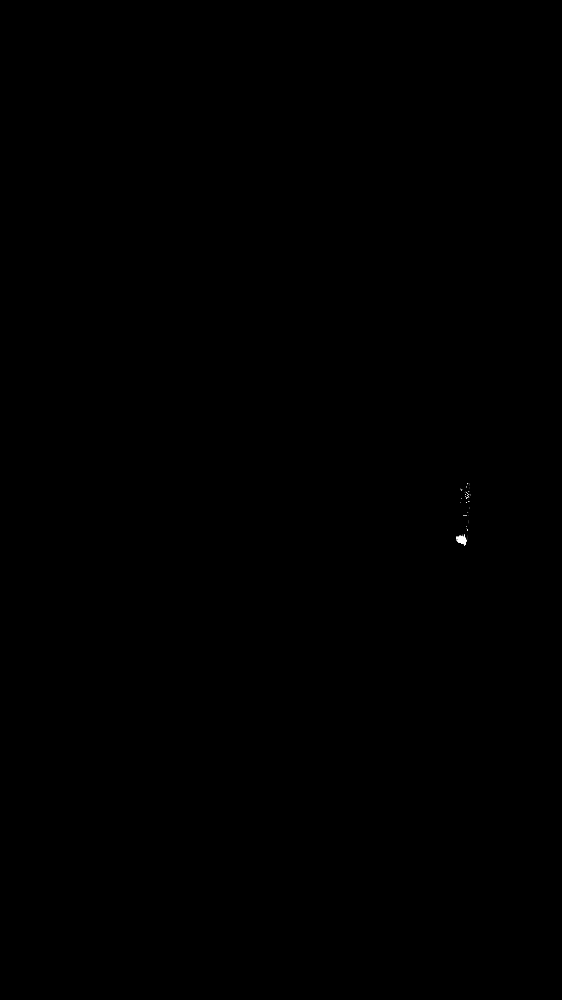

In [ ]:
mvideo = cv2.VideoCapture('process/5_hard_houses.mp4')
mvideo.set(cv2.CAP_PROP_POS_FRAMES, 630)
ret, frame = mvideo.read()

mask = mask_color(frame, lower_col ,upper_col)
imshow(mask)

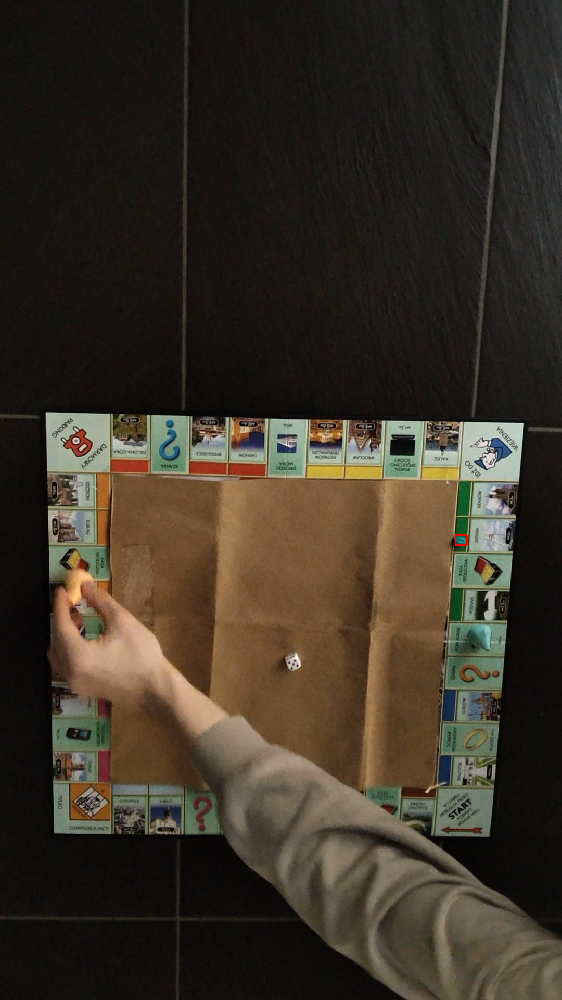

In [ ]:
contours, mask2_ = filter_for_house(frame, mask, 150, 750, 560)
# imshow(mask2_)

with_rectangles = draw_rectangle_from_contours(frame, contours)
imshow(with_rectangles)

In [ ]:
def check_if_house_placed(frame, num_of_houses, houses_counter, STABLE_PERIOD_H, stable_counter_h, placing):
    if num_of_houses > houses_counter:
        placing = True
    if num_of_houses >= houses_counter and placing and num_of_houses > 0:
        stable_counter_h +=1
    else:
        stable_counter_h = 0
        placing = False
    if stable_counter_h >= STABLE_PERIOD_H:
        cv2.putText(frame, "HOUSE PLACED", (1100, 500),
            cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 255), 2, cv2.LINE_AA)
        houses_counter = num_of_houses
        placing = False
    
    return frame, placing, stable_counter_h, houses_counter

In [ ]:
# P A R A M E T E R S 1080p
mvideo = cv2.VideoCapture('process/5_hard_houses.mp4')
if mvideo.isOpened():
    print('Video loaded')

mvideo_fps = mvideo.get(cv2.CAP_PROP_FPS)

mvideo.set(cv2.CAP_PROP_POS_FRAMES, 630)
ret, CALIB_FRAME = mvideo.read()

CALIB_CROP = CALIB_FRAME[1033:1043, 878:888]
MIN_AREA = 150
MAX_AREA = 750
EPSILON = 450
STABLE_PERIOD_H = 10
houses_counter = 0
placing = False
stable_counter_h = 0

# 4_easy config: calib_bounds, min,max,epsilon: [1175:1185, 195:208] works fine, 150, 750, 450
# 5_easy config: calib_bounds, min,max,epsilon: [1175:1185, 195:208], 150, 650, 360
######################################
  
mvideo = cv2.VideoCapture('process/5_hard_houses.mp4')
mvideo.set(cv2.CAP_PROP_POS_FRAMES, 0)
mvideo_width = int(mvideo.get(3))
mvideo_height = int(mvideo.get(4))
mvideo_fps = mvideo.get(cv2.CAP_PROP_FPS)
mvideo_track = cv2.VideoWriter('./houses_tempname.avi', cv2.VideoWriter_fourcc(*'DIVX'), mvideo_fps, (mvideo_width + 800, mvideo_height))

mvideo.set(cv2.CAP_PROP_POS_FRAMES, 0)

_ = 0
while mvideo.isOpened():
    ret, frame = mvideo.read()
    
    strip_width = 800
    frame = cv2.copyMakeBorder(frame, 0, 0, 0, strip_width, cv2.BORDER_CONSTANT, value=(0,0,0))

    if ret:      
      try:
        houses = find_houses(frame, CALIB_CROP, MIN_AREA, MAX_AREA, EPSILON)
        frame = draw_houses_frame(frame, houses)
        frame, placing, stable_counter_h, houses_counter = check_if_house_placed(frame, len(houses), houses_counter, STABLE_PERIOD_H, stable_counter_h, placing)
        
      except: pass

      mvideo_track.write(frame)
      _ += 1
      
      # if _ == 600:
      #   break
      
    else:
        break

mvideo_track.release()

Video loaded


### Rolling the dice

In [ ]:
def distance_between_boxes(box1,box2):
    return (box1[0] + box1[2]/2 - box2[0] - box1[2]/2)**2 + (box1[1] + box1[3]/2 - box2[1] - box1[3]/2)**2

distance_between_boxes((0,0,4,4),(4,4,4,4))

32.0

In [ ]:
def approximate_cvbbox(box, more=5):
    x = box[0] - more
    y = box[1] - more
    w = box[2] + more
    h = box[3] + more

    return (x, y, w, h)


In [ ]:
cap_h = cv2.VideoCapture("quality_1080/5_hard.mp4")
i = 0

tracker =cv2.legacy_TrackerTLD.create()

CALIBRATION_PERIOD = 1
STABLE_PERIOD = 10
ROLL_EPSILON = 100000
STABLE_EPSILON = 1000
EVENT_LENGTH = 5
last_box = None
distances = []
stable_counter = 0
rolling = False
last_event = 0
while (True):
    #
    _, frame_h = cap_h.read()
    #_, frame_h = cap_h.read()
    _, frame_h = cap_h.read()
    i+=1
    drawing = frame_h.copy()
    if i == CALIBRATION_PERIOD: #since camera moves only slightly, we can use the same center for the whole video
        _, contour = find_center_space(frame_h)
        if contour is not None:
            boxes = find_possible_dice_positions(frame_h,contour)
            if len(boxes) == 0:
                CALIBRATION_PERIOD+=1
                continue
            last_box = boxes[0]
            draw_bbox(drawing,boxes[0], (0, 255, 0))
            ok = tracker.init(frame_h, approximate_cvbbox(boxes[0],25))
        
    # if i == CALIBRATION_PERIOD:
    #     imshow(drawing)
    if i > CALIBRATION_PERIOD:
        ok,new_box = tracker.update(frame_h)
        distance = distance_between_boxes(last_box, new_box)
        if distance > ROLL_EPSILON:
            rolling = True
        if distance < STABLE_EPSILON and rolling:
            stable_counter +=1
        else:
            stable_counter = 0
        if stable_counter >= STABLE_PERIOD:
            rolling = False
            print("Rolling finished, change turn")
            last_event = i
            

        last_box = new_box
        if last_event + EVENT_LENGTH > i:
            cv2.putText(drawing, "Rolling finished", (10, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)
            
        draw_bbox(drawing,new_box, (0, 0, 255))
    cv2.imshow('frame', cv2.resize(drawing,(900,480)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break


AttributeError: module 'cv2' has no attribute 'legacy_TrackerTLD'

### Selling for mortgage

[Implementation](#Mortgages)

### Reading game status

Game status includes:
- player turn
- properties a player owns, and how many are mortgaged
- real estate a player owns 

In [32]:
class PlayerColors:
    ORANGE = "Orange"
    GREEN = "Green"
class Player:
    def __init__(self,color:PlayerColors):
        self.color = color
        self.cards = 0
        self.num_houses = 0
        self.num_mortgaged = 0
    
    def add_card(self):
        self.cards+=1
    def add_mortgage(self):
        self.num_mortgaged+=1
    def add_real_estate(self):
        self.num_houses +=1
    def status(self):
        return f"Player {self.color} has {self.cards} properties and {self.num_houses} houses and {self.num_mortgaged} mortgages"

In [33]:
class GameController():
    def __init__(self):
        self.player_orange = Player(PlayerColors.ORANGE)
        self.player_green = Player(PlayerColors.GREEN)
        self.turn = 0
    def dice_roll(self):
        self.turn = (self.turn+1)%2
    def get_current_player(self) -> Player:
        if self.turn == 0:
            return self.player_orange
        else:
            return self.player_green
    def update(self,event):
        if event is None or event =="":
            return None
        if event == "roll":
            self.dice_roll()
        else:
            player = self.get_current_player()
            if event == "New card placed!":
                player.add_card()
            if event == "Card mortgaged!":
                player.add_mortgage()
            if event == "Real estate placed!":
                player.add_real_estate()
            else :
                print("UNKNOWN EVENT")
    def get_status(self):
        return f"Player {self.get_current_player().color} turn", self.player_orange.status(), self.player_green.status()



In [34]:
class DiceController():
    STABLE_PERIOD = 10
    ROLL_EPSILON = 100000
    STABLE_EPSILON = 1000
    def __init__(self) -> None:
        self.last_box = None
        self.rolling = False
        self.stable_counter = 0
    def set_initial_box(self,box):
        self.last_box = box
    def update(self,new_box):
        distance = distance_between_boxes(self.last_box, new_box)
        #print(distance,self.stable)
        self.last_box = new_box
        if distance > DiceController.ROLL_EPSILON:
            self.rolling = True
        if distance < DiceController.STABLE_EPSILON and self.rolling:
            self.stable_counter +=1
        else:
            self.stable_counter = 0
        if self.stable_counter >= DiceController.STABLE_PERIOD:
            self.rolling = False
            return "roll"
        return None
            # print("Rolling finished, change turn")
            

In [35]:
stop

NameError: name 'stop' is not defined

In [38]:
cap_h = cv2.VideoCapture("quality_1080/5_hard.mp4")
cap_h.set(cv2.CAP_PROP_POS_FRAMES, 0)
i = 0

tracker =cv2.legacy_TrackerTLD.create()

CALIBRATION_PERIOD = 1

EVENT_LENGTH = 5
last_box = None
distances = []

last_event = 0
game_controller = GameController()
dice_controller = DiceController()
card_controller = CardController()

# HOUSE PARAMETERS
add_house = False


# SETTING COUNTER TRACKER
mvideo = cv2.VideoCapture('process/3_hard.mp4')
mvideo.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, CALIB_FRAME = mvideo.read()
 
BOXES_DISTANCE = 50
STABLE_PERIOD_C = 15
MOVE_EPSILON = 50
STABLE_EPSILON_C = 50
distances_c = []
stable_counter_c = 0
moving = False
appx=5
# 3_eazy orangeU=3000
orangeCalib = CALIB_FRAME[565:585, 150:175]
# 3_hard
# orangeCalib = CALIB_FRAME[1460:1490, 158:188]
# 5_hard orangeL,U= 1600, 2400
orangeL = 1600
orangeU = 3000
last_box = None
flagO = 0
last_box_COUNTER = None
ret, FIRST_FRAME = cap_h.read()
playerO_bbox, cropO_ = get_player_box(FIRST_FRAME, orangeCalib, orangeL, orangeU, inv=0, approx=appx)
playerO_tracker = create_tracker('MIL')

# config video saver
mvideo_width = int(cap_h.get(3))
mvideo_height = int(cap_h.get(4))
mvideo_fps = cap_h.get(cv2.CAP_PROP_FPS)
mvideo_track = cv2.VideoWriter('./final_final_final.avi', cv2.VideoWriter_fourcc(*'DIVX'), mvideo_fps, (mvideo_width + 800, mvideo_height))

while cap_h.isOpened():
    _, frame_h = cap_h.read()
    #_, frame_h = cap_h.read()
    _, frame_h = cap_h.read()
    i+=1
    drawing = frame_h.copy()
    
    # black strip for info
    strip_width = 800
    frame = cv2.copyMakeBorder(frame, 0, 0, 0, strip_width, cv2.BORDER_CONSTANT, value=(0,0,0))
    
    if i == CALIBRATION_PERIOD: #since camera moves only slightly, we can use the same center for the whole video
        _, contour = find_center_space(frame_h)
        if contour is not None:
            boxes = find_possible_dice_positions(frame_h,contour)
            if len(boxes) == 0:
                CALIBRATION_PERIOD+=1
                continue
            dice_controller.set_initial_box(boxes[0])
            draw_bbox(drawing,boxes[0], (0, 255, 0))
            ok = tracker.init(frame_h, approximate_cvbbox(boxes[0],25))
        
    if i > CALIBRATION_PERIOD:

        ### DICE
        ok,new_box = tracker.update(frame_h)
        draw_bbox(drawing,new_box, (0, 0, 255))
        dice_event = dice_controller.update(new_box)
        if dice_event:
            print(dice_event)
        game_controller.update(dice_event)
        ### Cards
        cards = find_cards(frame_h)
        drawing = draw_card_frame(drawing, cards)
        cards_images = get_cards_images(frame_h,cards)
        card_event = card_controller.update(cards_images)
        if card_event:
            print(card_event)
        game_controller.update(card_event)
        
        ### Houses
        try:
            houses = find_houses(frame, CALIB_CROP, MIN_AREA, MAX_AREA, EPSILON)
            frame = draw_houses_frame(frame, houses)
            frame, placing, stable_counter_h, houses_counter, add_house = check_if_house_placed(frame, len(houses), houses_counter, STABLE_PERIOD_H, stable_counter_h, placing, add_house)
            if add_house:
                game_controller.update("Real estate placed!")
        
        except: pass

        ### Counter tracking
        ok, bboxO = playerO_tracker.update(frame)
        if ok: draw_bbox(frame, bboxO, (0, 255, 0))
        if i == CALIBRATION_PERIOD + 1:
            last_box_COUNTER = bboxO
            
        # checking if counter moved
        frame, moving, stable_counter_c = check_if_counter_moved(frame, last_box_COUNTER, bboxO, MOVE_EPSILON, STABLE_EPSILON_C, STABLE_PERIOD_C, stable_counter_c, moving)
        last_box_COUNTER = bboxO
        ################################################################
        
        turn_text, orange_text, green_text = game_controller.get_status()
        if dice_event or card_event:
            print(turn_text, orange_text, green_text)
        cv2.putText(drawing, turn_text, (10, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)
            
        
    # cv2.imshow('frame', cv2.resize(drawing,(900,480)))

    # res = cv2.waitKey(1)


    mvideo_track.write(frame)

    # Stop if the user presses "q"
    # if res & 0xFF == ord('q'):
        # break

error: Unknown C++ exception from OpenCV code